In [17]:
import os
import librosa
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
import unicodedata
import re
import json

# Note: This notebook demonstrates the preprocessing pipeline
# that matches src/preprocess.py


In [18]:
def plot_waveform(audio, sr, title):
    plt.figure(figsize=(12, 3))
    plt.plot(audio)
    plt.title(title)
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.show()

def plot_spectrogram(audio, sr, title):
    spec = librosa.feature.melspectrogram(y=audio, sr=sr)
    spec_db = librosa.power_to_db(spec, ref=np.max)

    plt.figure(figsize=(12, 4))
    librosa.display.specshow(spec_db, sr=sr, x_axis='time', y_axis='mel')
    plt.colorbar(format="%+2.f dB")
    plt.title(title)
    plt.show()

def normalize_text(text):
    text = unicodedata.normalize("NFKC", text)
    text = text.strip()
    text = re.sub(r"\s+", " ", text)
    text = text.replace("’", "'")
    text = re.sub(r"[^\w\s\u0900-\u097F']", " ", text)
    return text.strip()


In [19]:
# Additional functions matching preprocess.py

def extract_full_transcript(transcript_path):
    """
    Extract full transcript text from JSON file.
    The transcript JSON contains segments with start, end, and text.
    """
    try:
        with open(transcript_path, 'r', encoding='utf-8') as f:
            segments = json.load(f)
        
        # Combine all segment texts
        full_text = " ".join([segment.get('text', '') for segment in segments])
        return normalize_text(full_text)
    except Exception as e:
        print(f"Error reading transcript {transcript_path}: {e}")
        return None

# Update normalize_text to match preprocess.py exactly
def normalize_text_updated(text):
    """
    Normalize Hindi text for ASR training (updated version matching preprocess.py).
    """
    # Normalize Unicode
    text = unicodedata.normalize("NFKC", text)
    
    # Strip whitespace
    text = text.strip()
    
    # Replace smart quotes
    text = text.replace("'", "'")
    text = text.replace("'", "'")
    text = text.replace(""", '"')
    text = text.replace(""", '"')
    
    # Normalize whitespace
    text = re.sub(r"\s+", " ", text)
    
    # Keep Hindi Devanagari (U+0900 to U+097F), basic Latin, digits, and common punctuation
    text = re.sub(r"[^\w\s\u0900-\u097F',.\-!?]", " ", text)
    
    return text.strip()

# Override normalize_text with updated version
normalize_text = normalize_text_updated

print("✓ Functions loaded: extract_full_transcript, normalize_text (updated)")


✓ Functions loaded: extract_full_transcript, normalize_text (updated)


In [20]:
# Configuration - matching preprocess.py
TARGET_SR = 16000  # Whisper uses 16kHz
TRIM_TOP_DB = 30  # Trim silence threshold

# Test file paths
RAW_AUDIO = os.path.join("..", "data", "test", "audio", "825780.wav")
RAW_TRANSCRIPT = os.path.join("..", "data", "test", "transcript", "825780.json")

print(f"Audio file: {RAW_AUDIO}")
print(f"Transcript file: {RAW_TRANSCRIPT}") 


Audio file: ..\data\test\audio\825780.wav
Transcript file: ..\data\test\transcript\825780.json


In [21]:
# Load raw audio (preserves original sample rate)
audio_raw, sr_raw = librosa.load(RAW_AUDIO, sr=None, mono=False)

print("Original Sample Rate:", sr_raw, "Hz")
print("Audio Shape:", audio_raw.shape)
print("Duration:", len(audio_raw) / sr_raw, "seconds")

# Display audio player
if len(audio_raw.shape) > 1:
    # If stereo, convert to mono for playback
    audio_mono = librosa.to_mono(audio_raw)
    ipd.Audio(audio_mono, rate=sr_raw)
else:
    ipd.Audio(audio_raw, rate=sr_raw)


Original Sample Rate: 44100 Hz
Audio Shape: (17153509,)
Duration: 388.96845804988664 seconds


Mono audio shape: (17153509,)
Duration: 388.96845804988664 seconds


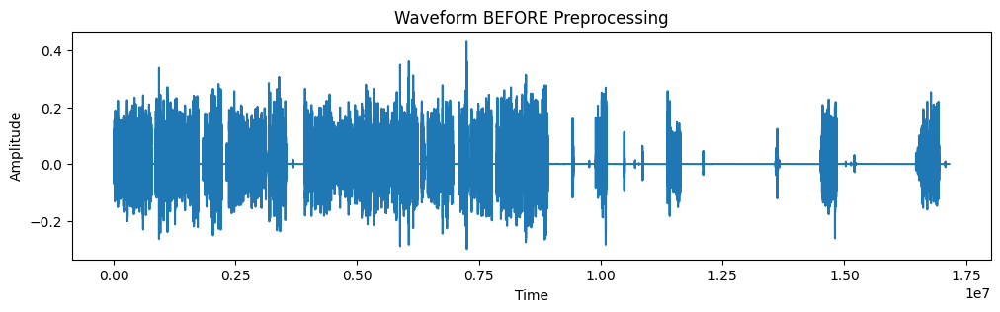

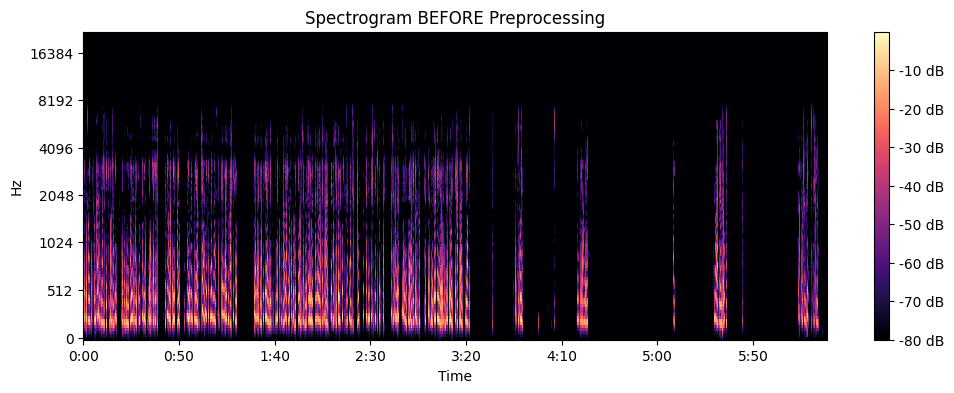

In [22]:
# Convert to mono if stereo (matching preprocess.py logic)
if len(audio_raw.shape) > 1:
    mono_raw = librosa.to_mono(audio_raw)
else:
    mono_raw = audio_raw

print("Mono audio shape:", mono_raw.shape)
print("Duration:", len(mono_raw) / sr_raw, "seconds")

# Visualize before preprocessing
plot_waveform(mono_raw, sr_raw, "Waveform BEFORE Preprocessing")
plot_spectrogram(mono_raw, sr_raw, "Spectrogram BEFORE Preprocessing")


In [23]:
# Step 1: Convert to mono (already done above)
audio = mono_raw.copy()

# Step 2: Resample to 16kHz (Whisper's required sample rate)
if sr_raw != TARGET_SR:
    audio = librosa.resample(audio, orig_sr=sr_raw, target_sr=TARGET_SR)
    print(f"Resampled from {sr_raw}Hz to {TARGET_SR}Hz")
else:
    print(f"Audio already at {TARGET_SR}Hz")

# Step 3: Normalize amplitude to [-1, 1]
max_abs = np.max(np.abs(audio))
if max_abs > 0:
    audio = audio / max_abs
    print(f"Normalized amplitude (max was {max_abs:.4f})")
else:
    print("Warning: Audio has zero amplitude")

print(f"Processed shape: {audio.shape}")
print(f"Duration: {len(audio) / TARGET_SR:.2f} seconds")

Resampled from 44100Hz to 16000Hz
Normalized amplitude (max was 0.4312)
Processed shape: (6223496,)
Duration: 388.97 seconds


In [24]:
# Step 4: Trim silence from beginning and end
audio_trimmed, _ = librosa.effects.trim(audio, top_db=TRIM_TOP_DB)

duration_before = len(audio) / TARGET_SR
duration_after = len(audio_trimmed) / TARGET_SR
trimmed_seconds = duration_before - duration_after

print(f"Duration before trimming: {duration_before:.2f} seconds")
print(f"Duration after trimming: {duration_after:.2f} seconds")
print(f"Trimmed: {trimmed_seconds:.2f} seconds ({trimmed_seconds/duration_before*100:.1f}%)")


Duration before trimming: 388.97 seconds
Duration after trimming: 384.32 seconds
Trimmed: 4.65 seconds (1.2%)


In [25]:
# Load and process transcript using the same function as preprocess.py
print("Loading transcript from JSON...")
transcript_text = extract_full_transcript(RAW_TRANSCRIPT)

if transcript_text:
    print(f"\n✓ Successfully extracted transcript")
    print(f"  Length: {len(transcript_text)} characters")
    print(f"  Word count: {len(transcript_text.split())} words")
    
    # Show first 500 characters
    print("\n" + "="*60)
    print("Processed Transcript (first 500 chars):")
    print("="*60)
    print(transcript_text[:500])
    if len(transcript_text) > 500:
        print("...")
    
    # Show original JSON structure for comparison
    print("\n" + "="*60)
    print("Original JSON Structure (first segment):")
    print("="*60)
    with open(RAW_TRANSCRIPT, "r", encoding="utf-8") as f:
        segments = json.load(f)
        if segments:
            print(json.dumps(segments[0], indent=2, ensure_ascii=False))
else:
    print("✗ Failed to extract transcript")


Loading transcript from JSON...

✓ Successfully extracted transcript
  Length: 2986 characters
  Word count: 726 words

Processed Transcript (first 500 chars):
अब काफी अच्छा होता है क्योंकि उनकी जनसंख्या बहुत कम दी जा रही है तो हमें उनको देखना था तो एक देखना था मतलब वो तो देखना था लेकिन हमारा प्रोजेक्ट भी था कि जो जन जाती पाई जाती है उधर कि उधर की एरिया में उसके बारे में देखना अब अनुभव करके कुछ लिखना था तो वह तो बिना देखिए नहीं हो सकती थी तो हम वहां गया थे कुड़रमा घाटी तरफ पर दिवोग काफी जंगली एरिया है वह जो खांड जनजाति पाए जाती ना वहां पाए जाती है तो जंगल का सफर होता है जब हम रहने के लिए गए थे नातो चाहते के साथ जैसे हम वहाँ पहले एंटर किये थे तो पहले तो
...

Original JSON Structure (first segment):
{
  "start": 0.11,
  "end": 14.42,
  "speaker_id": 245746,
  "text": "अब काफी अच्छा होता है क्योंकि उनकी जनसंख्या बहुत कम दी जा रही है तो हमें उनको देखना था तो एक देखना था मतलब वो तो देखना था लेकिन हमारा प्रोजेक्ट भी था कि जो जन जाती पाई जाती है उधर कि उधर की एरिया में उसके बारे में देखना अब"

Final processed audio:
  Sample rate: 16000 Hz
  Duration: 384.32 seconds
  Shape: (6149120,)
  Amplitude range: [-0.6938, 1.0000]


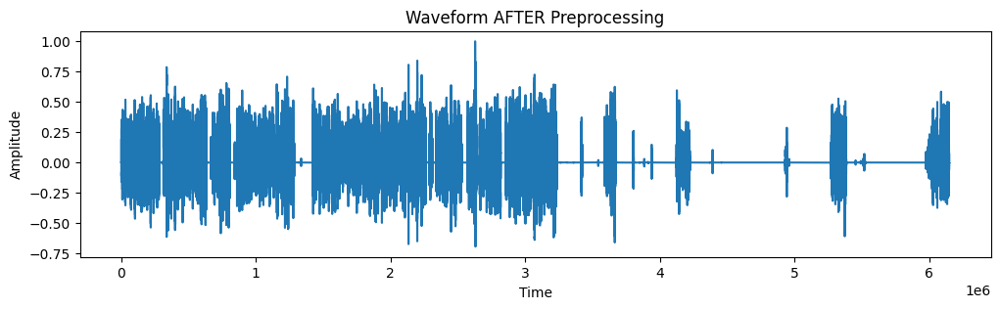

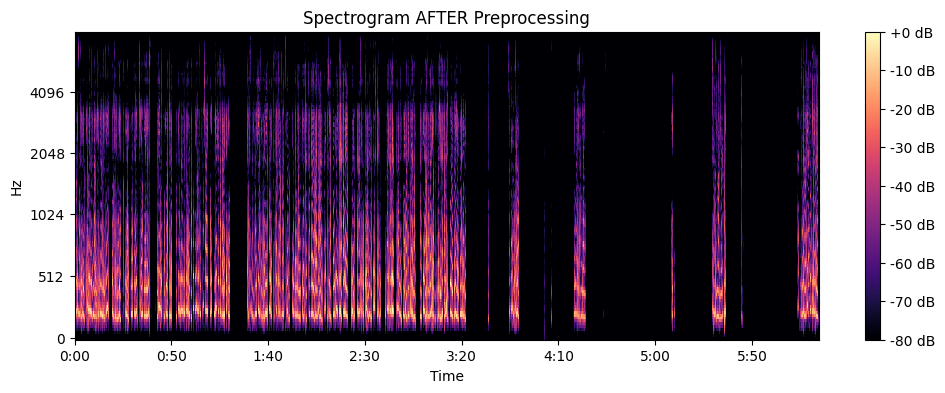

In [26]:
# Visualize after preprocessing
print("Final processed audio:")
print(f"  Sample rate: {TARGET_SR} Hz")
print(f"  Duration: {len(audio_trimmed) / TARGET_SR:.2f} seconds")
print(f"  Shape: {audio_trimmed.shape}")
print(f"  Amplitude range: [{np.min(audio_trimmed):.4f}, {np.max(audio_trimmed):.4f}]")

plot_waveform(audio_trimmed, TARGET_SR, "Waveform AFTER Preprocessing")
plot_spectrogram(audio_trimmed, TARGET_SR, "Spectrogram AFTER Preprocessing")


In [27]:
# Play processed audio
print("Playing processed audio (16kHz, mono, normalized, trimmed):")
ipd.Audio(audio_trimmed, rate=TARGET_SR)


Playing processed audio (16kHz, mono, normalized, trimmed):


In [28]:
# Save processed audio (matching preprocess.py output format)
import os

OUTPUT_DIR = os.path.join("..", "data", "processed_audio")
os.makedirs(OUTPUT_DIR, exist_ok=True)

output_path = os.path.join(OUTPUT_DIR, "825780.wav")
sf.write(output_path, audio_trimmed, TARGET_SR, format='WAV')

print(f"✓ Saved processed audio to: {output_path}")
print(f"  File size: {os.path.getsize(output_path) / 1024 / 1024:.2f} MB")

# Save processed transcript
TRANSCRIPT_OUTPUT_DIR = os.path.join("..", "data", "processed_transcript")
os.makedirs(TRANSCRIPT_OUTPUT_DIR, exist_ok=True)

transcript_output_path = os.path.join(TRANSCRIPT_OUTPUT_DIR, "825780.txt")
with open(transcript_output_path, 'w', encoding='utf-8') as f:
    f.write(transcript_text)

print(f"✓ Saved processed transcript to: {transcript_output_path}")
print(f"  File size: {os.path.getsize(transcript_output_path)} bytes")


✓ Saved processed audio to: ..\data\processed_audio\825780.wav
  File size: 11.73 MB
✓ Saved processed transcript to: ..\data\processed_transcript\825780.txt
  File size: 7504 bytes


## Summary

This notebook demonstrates the preprocessing pipeline that matches `src/preprocess.py`:

### Audio Preprocessing Steps:
1. **Load audio** - Preserves original sample rate
2. **Convert to mono** - If stereo, convert to single channel
3. **Resample to 16kHz** - Whisper's required sample rate
4. **Normalize amplitude** - Scale to [-1, 1] range
5. **Trim silence** - Remove leading/trailing silence (30dB threshold)
6. **Save as WAV** - 16kHz, mono, normalized

### Text Preprocessing Steps:
1. **Load JSON transcript** - Extract segments with timestamps
2. **Combine segments** - Join all text segments
3. **Normalize Unicode** - NFKC normalization
4. **Clean whitespace** - Remove extra spaces
5. **Normalize quotes** - Replace smart quotes
6. **Filter characters** - Keep Hindi Devanagari + basic punctuation
7. **Save as text** - Plain text file

### Key Parameters:
- **Target Sample Rate**: 16,000 Hz
- **Trim Threshold**: 30 dB
- **Max Duration**: 30 seconds (for training, files longer are excluded)

To process all files in the dataset, run:
```bash
python src/preprocess.py
```
